In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize
import math

In [2]:
def plotVelocityField(xVelocity, yVelocity, gridXLength, gridYLength, stride=5):
    """
    xVelocity, yVelocity: 2D arrays [ny, nx]
    gridXLength, gridYLength: physical size of domain
    stride: sample every Nth vector so it's not a solid block of arrows
    """

    ny, nx = xVelocity.shape

    # coordinates of cell centers
    x = np.linspace(0.5 * gridXLength / nx, gridXLength - 0.5 * gridXLength / nx, nx)
    y = np.linspace(0.5 * gridYLength / ny, gridYLength - 0.5 * gridYLength / ny, ny)
    X, Y = np.meshgrid(x, y)

    # take every `stride`-th arrow so the plot is readable
    Xs = X[::stride, ::stride]
    Ys = Y[::stride, ::stride]
    U  = xVelocity[::stride, ::stride]
    V  = yVelocity[::stride, ::stride]

    # speed magnitude
    speed = np.sqrt(U**2 + V**2)

    # we want arrow *length* to reflect speed. quiver does this naturally if we
    # use scale_units='xy' and a fixed scale. smaller scale => longer arrows.
    plt.figure(figsize=(8,6))
    q = plt.quiver(
        Xs, Ys,          # positions
        U, V,            # vector components
        angles='xy',
        scale_units='xy',
        scale=None,      # None => no automatic rescale; raw vector length = arrow length
        pivot='mid',     # arrow centered on the grid cell
        width=0.002      # thin arrows so they don't look like blobs
    )

    # optional: add a reference arrow so you know what length means
    # pick a spot (like bottom left) and draw one arrow with known speed
    ref_speed = np.max(speed)
    if ref_speed > 0:
        plt.quiverkey(
            q,
            X=0.1, Y=1.05, U=ref_speed,
            label=f"{ref_speed:.3f} m/s",
            labelpos='E',
            coordinates='axes'
        )

    plt.xlim(0, gridXLength)
    plt.ylim(0, gridYLength)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.title('Velocity Field')
    plt.xlabel('X-direction')
    plt.ylabel('Y-direction')
    plt.show()
def plotHeight():
    plt.figure(figsize=(8, 6))
    plt.imshow(height, extent=[0, gridXLength, 0, gridYLength], origin='lower', cmap='viridis')
    plt.colorbar(label='Height')
    plt.title('Height Distribution')
    plt.xlabel('X-direction')
    plt.ylabel('Y-direction')
    plt.show()
import matplotlib.pyplot as plt
import os

# make an output folder once
os.makedirs("frames", exist_ok=True)

def init_plot(height, gridXLength, gridYLength):
    # set up the figure only once
    fig, ax = plt.subplots(figsize=(8, 6))

    img = ax.imshow(
        height,
        extent=[0, gridXLength, 0, gridYLength],
        origin='lower',
        cmap='viridis',
        vmin=height.min(),
        vmax=height.max(),
        animated=False,
        interpolation='nearest',  # no smoothing = faster
    )

    cbar = fig.colorbar(img, ax=ax, label='Height')

    ax.set_xlabel('X-direction')
    ax.set_ylabel('Y-direction')

    plt.close(fig)

    return fig, ax, img, cbar

def saveHeightFrameFast(fig, ax, img, cbar, height, frame_idx):
    # update image data in-place
    img.set_data(height)

    # OPTIONAL: if dynamic range changes a lot, update vmin/vmax.
    # If your wave heights don't change massively, skip these two lines for speed.
    img.set_clim(vmin=height.min(), vmax=height.max())

    # update colorbar to match new clim
    cbar.update_normal(img)

    ax.set_title(f'Height Distribution (frame {frame_idx})')

    fig.savefig(f"frames/frame_{frame_idx:05d}.png", dpi=150)

def make_bathymetry(nx, ny):
    """
    Create a static bottomTopography / bathymetry field b with ghost cells.
    Shape will be (ny+2, nx+2) to match your h,u,v arrays.

    We place 3 circular mounds (like seamounts) along a vertical column,
    all centered at the same x position, at ~25%, ~50%, ~75% of the domain in y.

    Returns:
        b : np.ndarray of shape (ny+2, nx+2)
    """

    # ------------------------
    # tunable parameters
    # ------------------------

    # physical domain size in "meters" or whatever units you're using
    Lx = 1.0
    Ly = 1.0

    # where (in x) the column of mounds sits, as a fraction of domain width
    mound_x_frac = 0.4 # 0 = left edge, 1 = right edge

    # y positions of the 3 mounds (fractions of domain height)
    mound_y_fracs = np.array([0.25, 0.50, 0.75])

    # mound peak height (how tall the bump in the ground is)
    mound_height = 0.5  # increase = taller seamount

    # mound "radius" scale (controls how wide each mound spreads)
    mound_radius = 0.08  # fraction of domain size (isotropic)

    # ------------------------
    # build coordinate grids (including ghosts)
    # ------------------------
    dx = Lx / nx
    dy = Ly / ny

    # cell-centered coordinates for j=1..ny, i=1..nx
    x_coords = (np.arange(nx+2) - 0.5) * dx  # includes ghosts at 0 and nx+1
    y_coords = (np.arange(ny+2) - 0.5) * dy

    # 2D mesh
    X, Y = np.meshgrid(x_coords, y_coords, indexing="xy")

    # ------------------------
    # compute bathymetry
    # ------------------------
    b = np.zeros((ny+2, nx+2))

    # absolute mound centers in physical coords
    mound_x = mound_x_frac * Lx
    mound_ys = mound_y_fracs * Ly

    # convert mound_radius (fraction) -> physical sigma
    sigma = mound_radius * max(Lx, Ly)

    # add all 3 mounds
    for y0 in mound_ys:
        # radial distance from this mound center
        r2 = (X - mound_x)**2 + (Y - y0)**2

        # gaussian bump in the bottom topography
        bump = mound_height * np.exp(-r2 / (2.0 * sigma * sigma))

        b += bump

    # ------------------------
    # optional: make ghost cells sane
    # copy nearest interior row/col outward so slopes at edges aren't crazy.
    # left/right ghosts
    b[:, 0]     = b[:, 1]
    b[:, nx+1]  = b[:, nx]
    # bottom/top ghosts
    b[0, :]     = b[1, :]
    b[ny+1, :]  = b[ny, :]

    return b
import matplotlib.pyplot as plt
import numpy as np

def plot_bathymetry(b, nx, ny):
    """
    Plot the bathymetry (bottom topography) field.
    Expects b to have shape (ny+2, nx+2), including ghost cells.
    """
    # Extract physical domain (exclude ghost cells)
    b_phys = b[1:ny+1, 1:nx+1]

    plt.figure(figsize=(6, 5))
    im = plt.imshow(
        b_phys,
        origin='lower',
        cmap='terrain',
        extent=[0, 1, 0, 1]
    )
    plt.colorbar(im, label='Bathymetry Height (m)')
    plt.title('Bottom Topography')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.tight_layout()
    plt.show()

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from numba import njit, prange

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

def plot_particle_advection_vectorized(
    xVelocity, yVelocity,
    extent=(0.0, 1.0, 0.0, 1.0),
    n_seeds_x=24, n_seeds_y=24,
    path_steps=120,
    step_cfl=0.6,
    seed_jitter=0.12,
    linewidth=1.0,
    arrow_scale=18.0,
    ax=None
):
    """
    RK2 particle advection (vectorized over all particles; no Numba needed).
    Uses LineCollection for fast drawing + a single quiver for arrowheads.
    """
    u = np.asarray(xVelocity, dtype=np.float64)
    v = np.asarray(yVelocity, dtype=np.float64)
    ny, nx = u.shape
    xmin, xmax, ymin, ymax = extent
    dx = (xmax - xmin) / (nx - 1)
    dy = (ymax - ymin) / (ny - 1)

    # --- CFL-ish step size
    speed = np.hypot(u, v)
    vmax = np.nanmax(speed)
    if not np.isfinite(vmax) or vmax == 0.0:
        vmax = 1.0
    dt = step_cfl * min(dx, dy) / vmax

    # --- Seeds
    xs = np.linspace(xmin + 0.5 * dx, xmax - 0.5 * dx, n_seeds_x)
    ys = np.linspace(ymin + 0.5 * dy, ymax - 0.5 * dy, n_seeds_y)
    XX, YY = np.meshgrid(xs, ys)
    seeds_x = XX.ravel()
    seeds_y = YY.ravel()
    if seed_jitter > 0:
        rng = np.random.default_rng(0)
        seeds_x += (rng.random(seeds_x.size) - 0.5) * seed_jitter * dx
        seeds_y += (rng.random(seeds_y.size) - 0.5) * seed_jitter * dy

    nP = seeds_x.size

    # --- Vectorized bilinear sampler for arrays of (x,y)
    def sample(field, x, y):
        # fractional indices
        sx = (x - xmin) / dx
        sy = (y - ymin) / dy
        i0 = np.floor(sx).astype(np.int64)
        j0 = np.floor(sy).astype(np.int64)
        # clamp so i0+1, j0+1 exist
        i0 = np.clip(i0, 0, nx - 2)
        j0 = np.clip(j0, 0, ny - 2)
        tx = sx - i0
        ty = sy - j0

        f00 = field[j0,     i0    ]
        f10 = field[j0,     i0 + 1]
        f01 = field[j0 + 1, i0    ]
        f11 = field[j0 + 1, i0 + 1]
        return ((1 - tx) * (1 - ty) * f00
              +      tx  * (1 - ty) * f10
              + (1 - tx) *      ty  * f01
              +      tx  *      ty  * f11)

    # --- Allocate trajectories: shape (steps+1, nP)
    X = np.empty((path_steps + 1, nP), dtype=np.float64)
    Y = np.empty((path_steps + 1, nP), dtype=np.float64)
    X[0] = seeds_x
    Y[0] = seeds_y

    # alive mask for particles still in bounds
    alive = np.ones(nP, dtype=bool)

    # --- RK2 advection loop (vectorized over particles)
    for k in range(path_steps):
        xk = X[k]
        yk = Y[k]

        # if none alive, stop early
        if not alive.any():
            # fill remainder with NaNs
            X[k+1:] = np.nan
            Y[k+1:] = np.nan
            break

        # first stage
        u1 = np.zeros(nP); v1 = np.zeros(nP)
        idx = alive
        u1[idx] = sample(u, xk[idx], yk[idx])
        v1[idx] = sample(v, xk[idx], yk[idx])

        xm = xk + 0.5 * dt * u1
        ym = yk + 0.5 * dt * v1

        # midpoint must be inside
        mid_inside = (xm >= xmin) & (xm <= xmax) & (ym >= ymin) & (ym <= ymax)
        idx = alive & mid_inside

        u2 = np.zeros(nP); v2 = np.zeros(nP)
        u2[idx] = sample(u, xm[idx], ym[idx])
        v2[idx] = sample(v, xm[idx], ym[idx])

        xkp1 = xk + dt * u2
        ykp1 = yk + dt * v2

        # set new positions
        X[k+1] = xkp1
        Y[k+1] = ykp1

        # out-of-domain -> mark as dead and NaN positions
        inb = (xkp1 >= xmin) & (xkp1 <= xmax) & (ykp1 >= ymin) & (ykp1 <= ymax)
        newly_dead = alive & ~inb
        if newly_dead.any():
            X[k+1, newly_dead] = np.nan
            Y[k+1, newly_dead] = np.nan
        alive &= inb

    # --- Build line segments for LineCollection
    # segments from successive points where both endpoints are finite
    segs = []
    for p in range(nP):
        xrow = X[:, p]
        yrow = Y[:, p]
        # mask for valid consecutive pairs
        valid = np.isfinite(xrow) & np.isfinite(yrow)
        if valid.sum() < 2:
            continue
        # collect contiguous runs
        idxs = np.where(valid)[0]
        # split where gaps > 1
        breaks = np.where(np.diff(idxs) > 1)[0]
        runs = np.split(idxs, breaks + 1)
        for run in runs:
            if run.size < 2:
                continue
            xseg = xrow[run]
            yseg = yrow[run]
            segs.extend(np.stack([np.stack([xseg[:-1], yseg[:-1]], axis=1),
                                  np.stack([xseg[1:],  yseg[1: ]], axis=1)], axis=1))

    segs = np.array(segs, dtype=np.float64) if len(segs) else np.empty((0, 2, 2), dtype=np.float64)

    created_ax = False
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))
        created_ax = True

    lc = LineCollection(segs, linewidths=linewidth)
    ax.add_collection(lc)

    # --- Arrowheads at last finite segment of each path
    qx0 = []; qy0 = []; qdx = []; qdy = []
    finite = np.isfinite(X) & np.isfinite(Y)
    # last valid index per particle (vectorized trick)
    with np.errstate(invalid='ignore'):
        # index of last True along axis 0
        last_idx = finite.shape[0] - 1 - np.argmax(finite[::-1], axis=0)
    for p in range(nP):
        li = int(last_idx[p])
        if li >= 1 and np.isfinite(X[li, p]) and np.isfinite(X[li-1, p]):
            x0, y0 = X[li-1, p], Y[li-1, p]
            x1, y1 = X[li,   p], Y[li,   p]
            dx_a, dy_a = x1 - x0, y1 - y0
            if dx_a*dx_a + dy_a*dy_a > 1e-18:
                qx0.append(x0); qy0.append(y0); qdx.append(dx_a); qdy.append(dy_a)

    if qx0:
        ax.quiver(qx0, qy0, qdx, qdy, angles='xy', scale_units='xy', scale=arrow_scale, width=0.003)

    ax.set_xlim(xmin, xmax); ax.set_ylim(ymin, ymax)
    ax.set_aspect('equal')
    ax.set_xlabel('x'); ax.set_ylabel('y')
    ax.set_title('RK2 Particle Advection (vectorized NumPy)')
    # if created_ax:
    plt.tight_layout()
    plt.show()
    # return ax



In [3]:
import numpy as np
from numba import njit

def bc_mode_from_string(name: str) -> int:
    """
    Map human-readable boundary mode to int code for numba.

    0 = periodic wrap
    1 = reflective wall
    2 = open / zero-gradient
    """
    n = name.strip().lower()
    if n == "periodic":
        return 0
    elif n == "reflective":
        return 1
    elif n == "open" or n == "outflow" or n == "neumann":
        return 2
    else:
        # default or raise; raising is better so you notice
        raise ValueError(f"unknown bc mode {name!r}, expected 'periodic', 'reflective', or 'open'")

import numpy as np

def initializeWithRipple(numCellsX, numCellsY,
                         gridXLength, gridYLength,
                         layerDepth,
                         bumpAltitude,
                         bumpWidth,
                         bumpCenterX, bumpCenterY):
    """
    Returns h,u,v with ghost cells already allocated.
    Interior j=1..ny, i=1..nx is filled.
    Velocities start at 0.
    """
    nx = numCellsX
    ny = numCellsY

    # physical grid coordinates for cell centers
    x = np.linspace(0.0, gridXLength, nx)
    y = np.linspace(0.0, gridYLength, ny)
    X, Y = np.meshgrid(x, y, indexing="xy")

    # radial distance^2 from bump center
    numerator   = (X - bumpCenterX)**2 + (Y - bumpCenterY)**2
    denominator = 2.0 * (bumpWidth**2)

    # Gaussian mound on top of layerDepth
    interior_h = layerDepth + bumpAltitude * np.exp(-numerator / denominator)

    # allocate full arrays with ghost ring
    h_full = np.zeros((ny+2, nx+2), dtype=np.float64)
    u_full = np.zeros((ny+2, nx+2), dtype=np.float64)
    v_full = np.zeros((ny+2, nx+2), dtype=np.float64)

    # put interior_h into the interior region
    h_full[1:ny+1, 1:nx+1] = interior_h
    # u_full, v_full interior already 0

    return h_full, u_full, v_full

def initializeWithVortex(numCellsX, numCellsY,
                         gridXLength, gridYLength,
                         layerDepth,
                         x0, y0,
                         mode="solid",
                         Omega=4.0,          # used when mode="solid"  (rad/s in non-dim units)
                         Vmax=1.0, Rc=0.15,  # used when mode="rankine"
                         f=0.0, g=1.0,
                         balanced=False):
    """
    Returns h,u,v with ghost cells already allocated.
    Interior j=1..ny, i=1..nx is filled.

    mode="solid":     u = -Ω(y-y0), v = Ω(x-x0)
    mode="rankine":   uθ = Vmax * min(r/Rc, Rc/r), then convert to (u,v)

    balanced=True  -> sets a height anomaly η(r) so that
        dη/dr = (uθ^2/r + f uθ)/g  (gradient-wind balance)
      This greatly reduces initial gravity-wave transients.

    Units here are whatever your solver uses (often non-dimensional).
    """
    nx, ny = numCellsX, numCellsY
    f_int = f[1:ny+1, 1:nx+1]

    # cell-center coordinates
    x = np.linspace(0.0, gridXLength, nx)
    y = np.linspace(0.0, gridYLength, ny)
    X, Y = np.meshgrid(x, y, indexing="xy")

    dx = gridXLength / nx
    dy = gridYLength / ny

    # offsets & polar helpers
    xr = X - x0
    yr = Y - y0
    r = np.hypot(xr, yr)
    # avoid division by zero at center
    r_safe = np.where(r == 0.0, 1e-15, r)
    sinθ = np.where(r_safe > 0, yr / r_safe, 0.0)
    cosθ = np.where(r_safe > 0, xr / r_safe, 1.0)

    # tangential speed uθ(r)
    if mode == "solid":
        # solid-body: uθ = Ω r
        u_theta = Omega * r
    elif mode == "rankine":
        # piecewise: solid in core, 1/r outside
        u_theta = Vmax * np.minimum(r / Rc, Rc / np.maximum(r, 1e-15))
    else:
        raise ValueError("mode must be 'solid' or 'rankine'")

    # convert tangential to Cartesian (θ measured from +x axis CCW)
    # u = -uθ sinθ, v = +uθ cosθ
    u_interior = -u_theta * sinθ
    v_interior =  u_theta * cosθ

    # height field
    if balanced:
        # Numerically integrate dη/dr = (uθ^2/r + f uθ)/g along r, radially.
        # We do it by building a 1D profile vs r via binning, integrating, then mapping back.
        # Binning grid:
        r_max = np.hypot(gridXLength, gridYLength)
        nr = max(256, int(0.75 * (nx + ny)))  # decent radial resolution
        r_edges = np.linspace(0.0, r_max, nr + 1)
        r_cent = 0.5 * (r_edges[:-1] + r_edges[1:])

        # compute uθ and RHS on the full 2D, then bin-average onto r_cent
        utheta2_over_r = (u_theta**2) / np.maximum(r, 1e-15)
        rhs = (utheta2_over_r + f_int * u_theta) / g  # dη/dr

        # radial binning
        which = np.clip(np.digitize(r.ravel(), r_edges) - 1, 0, nr - 1)
        rhs_mean = np.bincount(which, weights=rhs.ravel(), minlength=nr)
        counts   = np.bincount(which, minlength=nr)
        rhs_mean = np.where(counts > 0, rhs_mean / np.maximum(counts, 1), 0.0)

        # integrate η(r) with trapezoid from 0
        drc = np.diff(r_cent, prepend=0.0)
        # use simple cumulative trapezoid: η_k ≈ Σ ( (rhs_k + rhs_{k-1})/2 * Δr )
        rhs_pad = np.concatenate([[rhs_mean[0]], rhs_mean])
        dr_pad  = np.concatenate([[r_cent[0]],   np.diff(r_cent)])
        eta_prof = np.cumsum(0.5 * (rhs_pad[1:] + rhs_pad[:-1]) * dr_pad)

        # map back η(r)
        eta_binned = eta_prof[which].reshape(r.shape)

        # remove mean anomaly to keep mass close to layerDepth
        eta_binned -= np.mean(eta_binned)

        interior_h = layerDepth + eta_binned
        # positivity floor if you run with small layerDepth
        interior_h = np.maximum(interior_h, 1e-8)
    else:
        # flat surface; the flow will adjust by emitting gravity waves
        interior_h = np.full((ny, nx), layerDepth, dtype=np.float64)

    # allocate with ghost ring
    h_full = np.zeros((ny + 2, nx + 2), dtype=np.float64)
    u_full = np.zeros((ny + 2, nx + 2), dtype=np.float64)
    v_full = np.zeros((ny + 2, nx + 2), dtype=np.float64)

    # place interior
    h_full[1:ny+1, 1:nx+1] = interior_h
    u_full[1:ny+1, 1:nx+1] = u_interior
    v_full[1:ny+1, 1:nx+1] = v_interior

    return h_full, u_full, v_full


@njit(fastmath=True)
def drive_left_boundary_height(height, xVelocity, yVelocity,
                               H0, waveAmp, waveFreq, t,
                               driveCols):
    """
    Impose a sinusoidal surface height at the left boundary columns [0:driveCols].

    height    : 2D array (ny, nx)
    xVelocity : 2D array (ny, nx)
    yVelocity : 2D array (ny, nx)
    H0        : base depth (e.g. 1.0)
    waveAmp   : wave amplitude (e.g. 0.02)
    waveFreq  : angular freq (rad/s)
    t         : current sim time
    driveCols : how many leftmost columns to overwrite (e.g. 3-5)

    returns nothing; modifies arrays in-place
    """
    ny, nx = height.shape
    target_h = H0 + waveAmp * np.sin(waveFreq * t)

    for j in range(ny):
        for i in range(driveCols):
            height[j, i] = target_h
            yVelocity[j, i] = 0.0  # optional: keep it 1D-ish

    # we do NOT force xVelocity here; let solver create it


from numba import njit
import numpy as np

@njit(fastmath=True)
def compute_dt(height, xVelocity, yVelocity,
               gravity, CFL, dx, dy,
               coriolis=None, nu=0.0):
    """
    Stable timestep for rotating shallow water (explicit):
      - Gravity-wave CFL: dt_cfl = CFL * min(dx,dy) / max(|u|+c, |v|+c)
      - Inertial (rotation) cap: dt_rot ≲ 0.9 / max(|f|)
      - Optional diffusion cap (if nu>0): dt_nu <= 0.25 * min(dx,dy)^2 / nu
    Arrays are assumed to have a 1-cell ghost ring; we scan interior only.
    """
    ny, nx = height.shape
    j0, j1 = 1, ny-1   # interior: [1..ny-2]
    i0, i1 = 1, nx-1

    # --- gravity-wave CFL ---
    maxSignal = 0.0
    for j in range(j0, j1):
        for i in range(i0, i1):
            c = np.sqrt(gravity * height[j, i])
            sx = abs(xVelocity[j, i]) + c
            sy = abs(yVelocity[j, i]) + c
            s  = sx if sx > sy else sy
            if s > maxSignal:
                maxSignal = s

    if maxSignal == 0.0:
        dt_cfl = 1e9
    else:
        cell_min = dx if dx < dy else dy
        dt_cfl = CFL * cell_min / maxSignal

    # --- rotation cap ---
    dt_rot = 1e9
    if coriolis is not None:
        fmax = 0.0
        for j in range(j0, j1):
            for i in range(i0, i1):
                fj = abs(coriolis[j, i])
                if fj > fmax:
                    fmax = fj
        if fmax > 0.0:
            dt_rot = 0.9 / fmax  # ~ < one inertial radian per step

    # --- diffusion cap (optional) ---
    dt_nu = 1e9
    if nu > 0.0:
        cell_min = dx if dx < dy else dy
        dt_nu = 0.25 * (cell_min * cell_min) / nu  # conservative 2D bound

    # return the most restrictive
    dt = dt_cfl if dt_cfl < dt_rot else dt_rot
    dt = dt if dt < dt_nu else dt_nu
    return dt

import numpy as np
from numba import njit

# bc_mode: 0=periodic, 1=reflective, 2=open
@njit
def apply_bc_numba(h, u, v, nx, ny, bc_mode):
    # LEFT / RIGHT boundaries (i = 0 and i = nx+1)
    for j in range(1, ny+1):
        if bc_mode == 0:  # periodic
            h[j, 0]      = h[j, nx]
            u[j, 0]      = u[j, nx]
            v[j, 0]      = v[j, nx]
            h[j, nx+1]   = h[j, 1]
            u[j, nx+1]   = u[j, 1]
            v[j, nx+1]   = v[j, 1]

        elif bc_mode == 1:  # reflective wall in x-normal direction
            # mirror depth
            h[j, 0]      = h[j, 1]
            h[j, nx+1]   = h[j, nx]
            # normal component u flips sign
            u[j, 0]      = -u[j, 1]
            u[j, nx+1]   = -u[j, nx]
            # tangential component v copies
            v[j, 0]      =  v[j, 1]
            v[j, nx+1]   =  v[j, nx]

        else:  # bc_mode == 2, open / zero-gradient
            h[j, 0]      = h[j, 1]
            u[j, 0]      = u[j, 1]
            v[j, 0]      = v[j, 1]
            h[j, nx+1]   = h[j, nx]
            u[j, nx+1]   = u[j, nx]
            v[j, nx+1]   = v[j, nx]

    # BOTTOM / TOP boundaries (j = 0 and j = ny+1)
    for i in range(1, nx+1):
        if bc_mode == 0:  # periodic
            h[0, i]      = h[ny, i]
            u[0, i]      = u[ny, i]
            v[0, i]      = v[ny, i]
            h[ny+1, i]   = h[1, i]
            u[ny+1, i]   = u[1, i]
            v[ny+1, i]   = v[1, i]

        elif bc_mode == 1:  # reflective wall in y-normal direction
            # mirror depth
            h[0, i]      = h[1, i]
            h[ny+1, i]   = h[ny, i]
            # normal component v flips
            v[0, i]      = -v[1, i]
            v[ny+1, i]   = -v[ny, i]
            # tangential component u copies
            u[0, i]      =  u[1, i]
            u[ny+1, i]   =  u[ny, i]

        else:  # bc_mode == 2, open / zero-gradient
            h[0, i]      = h[1, i]
            u[0, i]      = u[1, i]
            v[0, i]      = v[1, i]
            h[ny+1, i]   = h[ny, i]
            u[ny+1, i]   = u[ny, i]
            v[ny+1, i]   = v[ny, i]

    # Corners: you can just do something consistent.
    # simplest: copy from nearest edge cell
    # (doesn't matter much for 1-layer SWE unless you're super picky)
    if bc_mode == 0:
        h[0,0]          = h[ny, nx]
        u[0,0]          = u[ny, nx]
        v[0,0]          = v[ny, nx]
        h[0,nx+1]       = h[ny,1]
        u[0,nx+1]       = u[ny,1]
        v[0,nx+1]       = v[ny,1]
        h[ny+1,0]       = h[1,nx]
        u[ny+1,0]       = u[1,nx]
        v[ny+1,0]       = v[1,nx]
        h[ny+1,nx+1]    = h[1,1]
        u[ny+1,nx+1]    = u[1,1]
        v[ny+1,nx+1]    = v[1,1]
    else:
        # copy from the adjacent interior corner
        h[0,0]          = h[1,1]
        u[0,0]          = u[1,1]
        v[0,0]          = v[1,1]
        h[0,nx+1]       = h[1,nx]
        u[0,nx+1]       = u[1,nx]
        v[0,nx+1]       = v[1,nx]
        h[ny+1,0]       = h[ny,1]
        u[ny+1,0]       = u[ny,1]
        v[ny+1,0]       = v[ny,1]
        h[ny+1,nx+1]    = h[ny,nx]
        u[ny+1,nx+1]    = u[ny,nx]
        v[ny+1,nx+1]    = v[ny,nx]


In [4]:
@njit
def compute_rhs_numba(h, u, v, dx, dy, g, nu, h_eps, nx, ny, b, coriolis, r_drag):
    """
    h,u,v shape = (ny+2, nx+2)
    valid physical cells: j=1..ny, i=1..nx
    nx,ny are the interior sizes (no ghosts)
    returns rh_h, rh_hu, rh_hv with same shape
    ghost rows/cols in the RHS will stay 0
    """
    rh_h  = np.zeros_like(h)
    rh_hu = np.zeros_like(h)
    rh_hv = np.zeros_like(h)

    # main flux divergence
    for j in range(1, ny+1):
        for i in range(1, nx+1):
            # neighbors in x
            il = i-1
            ir = i+1
            # neighbors in y
            jd = j-1
            ju = j+1

            # ------------ X faces ------------
            # right face between (j,i) [L] and (j,ir) [R]
            hL = h[j, i]
            uL = u[j, i]
            vL = v[j, i]

            hR = h[j, ir]
            uR = u[j, ir]
            vR = v[j, ir]

            huL = hL * uL
            hvL = hL * vL
            huR = hR * uR
            hvR = hR * vR

            # physical flux F(U) in x
            FL_h  = huL
            FL_hu = huL*uL + 0.5*g*hL*hL
            FL_hv = huL*vL

            FR_h  = huR
            FR_hu = huR*uR + 0.5*g*hR*hR
            FR_hv = huR*vR

            cL = np.sqrt(g*hL)
            cR = np.sqrt(g*hR)
            smax_x = max(abs(uL)+cL, abs(uR)+cR)

            Fh_right  = 0.5*(FL_h  + FR_h ) - 0.5*smax_x*(hR  - hL)
            Fhu_right = 0.5*(FL_hu + FR_hu) - 0.5*smax_x*(huR - huL)
            Fhv_right = 0.5*(FL_hv + FR_hv) - 0.5*smax_x*(hvR - hvL)

            # left face between (j,il) [L] and (j,i) [R]
            hL2 = h[j, il]
            uL2 = u[j, il]
            vL2 = v[j, il]

            hR2 = hL
            uR2 = uL
            vR2 = vL

            huL2 = hL2 * uL2
            hvL2 = hL2 * vL2
            huR2 = hR2 * uR2
            hvR2 = hR2 * vR2

            FL_h2  = huL2
            FL_hu2 = huL2*uL2 + 0.5*g*hL2*hL2
            FL_hv2 = huL2*vL2

            FR_h2  = huR2
            FR_hu2 = huR2*uR2 + 0.5*g*hR2*hR2
            FR_hv2 = huR2*vR2

            cL2 = np.sqrt(g*hL2)
            cR2 = np.sqrt(g*hR2)
            smax_x2 = max(abs(uL2)+cL2, abs(uR2)+cR2)

            Fh_left  = 0.5*(FL_h2  + FR_h2 ) - 0.5*smax_x2*(hR2  - hL2)
            Fhu_left = 0.5*(FL_hu2 + FR_hu2) - 0.5*smax_x2*(huR2 - huL2)
            Fhv_left = 0.5*(FL_hv2 + FR_hv2) - 0.5*smax_x2*(hvR2 - hvL2)

            dFh_dx  = (Fh_right  - Fh_left ) / dx
            dFhu_dx = (Fhu_right - Fhu_left) / dx
            dFhv_dx = (Fhv_right - Fhv_left) / dx

            # ------------ Y faces ------------
            # up face between (j,i) [B] and (ju,i) [T]
            hB = h[j, i]
            uB = u[j, i]
            vB = v[j, i]

            hT = h[ju, i]
            uT = u[ju, i]
            vT = v[ju, i]

            huB = hB * uB
            hvB = hB * vB
            huT = hT * uT
            hvT = hT * vT

            GL_h  = hvB
            GL_hu = huB*vB
            GL_hv = hvB*vB + 0.5*g*hB*hB

            GR_h  = hvT
            GR_hu = huT*vT
            GR_hv = hvT*vT + 0.5*g*hT*hT

            cB = np.sqrt(g*hB)
            cT = np.sqrt(g*hT)
            smax_y = max(abs(vB)+cB, abs(vT)+cT)

            Gh_up  = 0.5*(GL_h  + GR_h ) - 0.5*smax_y*(hT  - hB)
            Ghu_up = 0.5*(GL_hu + GR_hu) - 0.5*smax_y*(huT - huB)
            Ghv_up = 0.5*(GL_hv + GR_hv) - 0.5*smax_y*(hvT - hvB)

            # down face between (jd,i) [B] and (j,i) [T]
            hB2 = h[jd, i]
            uB2 = u[jd, i]
            vB2 = v[jd, i]

            hT2 = hB
            uT2 = uB
            vT2 = vB

            huB2 = hB2 * uB2
            hvB2 = hB2 * vB2
            huT2 = hT2 * uT2
            hvT2 = hT2 * vT2

            GL_h2  = hvB2
            GL_hu2 = huB2*vB2
            GL_hv2 = hvB2*vB2 + 0.5*g*hB2*hB2

            GR_h2  = hvT2
            GR_hu2 = huT2*vT2
            GR_hv2 = hvT2*vT2 + 0.5*g*hT2*hT2

            cB2 = np.sqrt(g*hB2)
            cT2 = np.sqrt(g*hT2)
            smax_y2 = max(abs(vB2)+cB2, abs(vT2)+cT2)

            Gh_down  = 0.5*(GL_h2  + GR_h2 ) - 0.5*smax_y2*(hT2  - hB2)
            Ghu_down = 0.5*(GL_hu2 + GR_hu2) - 0.5*smax_y2*(huT2 - huB2)
            Ghv_down = 0.5*(GL_hv2 + GR_hv2) - 0.5*smax_y2*(hvT2 - hvB2)

            dGh_dy  = (Gh_up  - Gh_down ) / dy
            dGhu_dy = (Ghu_up - Ghu_down) / dy
            dGhv_dy = (Ghv_up - Ghv_down) / dy

            # RHS = -(div F + div G)
            rh_h[j,i]  = -(dFh_dx  + dGh_dy)
            rh_hu[j,i] = -(dFhu_dx + dGhu_dy)
            rh_hv[j,i] = -(dFhv_dx + dGhv_dy)

            # --------- Coriolis source (conserved form) ---------
            # +f h v in x-momentum,  -f h u in y-momentum
            fij = coriolis[j,i]
            hij = h[j,i]
            rh_hu[j,i] +=  fij * hij * v[j,i]
            rh_hv[j,i] += -fij * hij * u[j,i]

    # --- bathymetry source term: -g * h * grad(b) ---
    for j in range(1, ny+1):
        jd = j-1
        ju = j+1
        for i in range(1, nx+1):
            il = i-1
            ir = i+1

            # centered slope of bottom
            dbdx = (b[j, ir] - b[j, il]) * 0.5 / dx
            dbdy = (b[ju, i] - b[jd, i]) * 0.5 / dy

            rh_hu[j,i] += -g * h[j,i] * dbdx
            rh_hv[j,i] += -g * h[j,i] * dbdy

    if r_drag != 0.0:
        for j in range(1, ny+1):
            for i in range(1, nx+1):
                rh_hu[j,i] -= r_drag * h[j,i] * u[j,i]
                rh_hv[j,i] -= r_drag * h[j,i] * v[j,i]



    # optional Laplacian viscosity on conserved variables
    if nu != 0.0:
        for j in range(1, ny+1):
            jd = j-1
            ju = j+1
            for i in range(1, nx+1):
                il = i-1
                ir = i+1

                h_ij   = h[j,i]
                hu_ij  = h_ij * u[j,i]
                hv_ij  = h_ij * v[j,i]

                lap_h  = (h[j,ir]  + h[j,il]  + h[ju,i]  + h[jd,i]  - 4.0*h_ij)
                hu_ir  = h[j,ir]*u[j,ir]
                hu_il  = h[j,il]*u[j,il]
                hu_ju  = h[ju,i]*u[ju,i]
                hu_jd  = h[jd,i]*u[jd,i]
                lap_hu = (hu_ir + hu_il + hu_ju + hu_jd - 4.0*hu_ij)
                hv_ir  = h[j,ir]*v[j,ir]
                hv_il  = h[j,il]*v[j,il]
                hv_ju  = h[ju,i]*v[ju,i]
                hv_jd  = h[jd,i]*v[jd,i]
                lap_hv = (hv_ir + hv_il + hv_ju + hv_jd - 4.0*hv_ij)

                rh_h[j,i]  += nu * lap_h
                rh_hu[j,i] += nu * lap_hu
                rh_hv[j,i] += nu * lap_hv

    return rh_h, rh_hu, rh_hv

@njit
def step_numba(h, u, v, dt, dx, dy, b, coriolis,
               g=1.0, nu=0.0, h_eps=1e-12,
               nx=0, ny=0,
               bc_mode=0, r_drag=0.0):
    # --- Stage 1 ---
    apply_bc_numba(h, u, v, nx, ny, bc_mode)

    rh_h, rh_hu, rh_hv = compute_rhs_numba(h, u, v, dx, dy, g, nu, h_eps, nx, ny, b, coriolis, r_drag)

    h1  = np.empty_like(h)
    u1  = np.empty_like(u)
    v1  = np.empty_like(v)
    hu1 = np.empty_like(h)  # store h1*u1
    hv1 = np.empty_like(h)

    for j in range(1, ny+1):
        for i in range(1, nx+1):
            hu0 = h[j,i]*u[j,i]
            hv0 = h[j,i]*v[j,i]

            h_pred  = h[j,i]  + dt * rh_h[j,i]
            hu_pred = hu0     + dt * rh_hu[j,i]
            hv_pred = hv0     + dt * rh_hv[j,i]

            if h_pred < h_eps:
                h_pred = h_eps

            h1[j,i]  = h_pred
            u1[j,i]  = hu_pred / h_pred
            v1[j,i]  = hv_pred / h_pred
            hu1[j,i] = hu_pred
            hv1[j,i] = hv_pred

    # it's fine to leave ghost ring of h1/u1/v1 uninitialized for now,
    # because we're about to fill them with apply_bc_numba.
    # But to avoid numba "use of uninitialized" worries, we can copy h,u,v ghosts:
    # simplest: start by copying the whole arrays, then overwrite interior
    for j in range(ny+2):
        for i in range(nx+2):
            if j == 0 or j == ny+1 or i == 0 or i == nx+1:
                h1[j,i]  = h[j,i]
                u1[j,i]  = u[j,i]
                v1[j,i]  = v[j,i]
                hu1[j,i] = h[j,i]*u[j,i]
                hv1[j,i] = h[j,i]*v[j,i]

    # --- Stage 2 ---
    apply_bc_numba(h1, u1, v1, nx, ny, bc_mode)

    rh_h2, rh_hu2, rh_hv2 = compute_rhs_numba(h1, u1, v1, dx, dy, g, nu, h_eps, nx, ny, b, coriolis, r_drag)

    h2 = np.empty_like(h)
    u2 = np.empty_like(u)
    v2 = np.empty_like(v)

    # We will again copy ghosts after computing interior
    for j in range(1, ny+1):
        for i in range(1, nx+1):
            hu0 = h[j,i]*u[j,i]
            hv0 = h[j,i]*v[j,i]

            h_final  = 0.5*( h[j,i]  + h1[j,i]  + dt*rh_h2[j,i] )
            hu_final = 0.5*( hu0     + hu1[j,i] + dt*rh_hu2[j,i] )
            hv_final = 0.5*( hv0     + hv1[j,i] + dt*rh_hv2[j,i] )

            if h_final < h_eps:
                h_final = h_eps

            h2[j,i] = h_final
            u2[j,i] = hu_final / h_final
            v2[j,i] = hv_final / h_final

    # fill ghost ring of h2,u2,v2 by copying from h1 just to init memory
    for j in range(ny+2):
        for i in range(nx+2):
            if j == 0 or j == ny+1 or i == 0 or i == nx+1:
                h2[j,i] = h1[j,i]
                u2[j,i] = u1[j,i]
                v2[j,i] = v1[j,i]

    # Final BC so caller gets a "ready" field for next step
    apply_bc_numba(h2, u2, v2, nx, ny, bc_mode)

    return h2, u2, v2


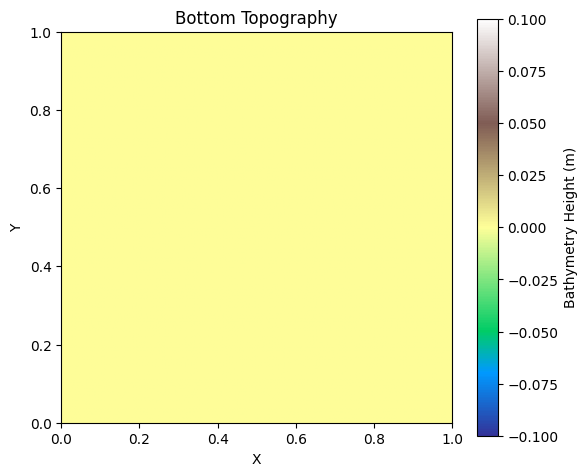

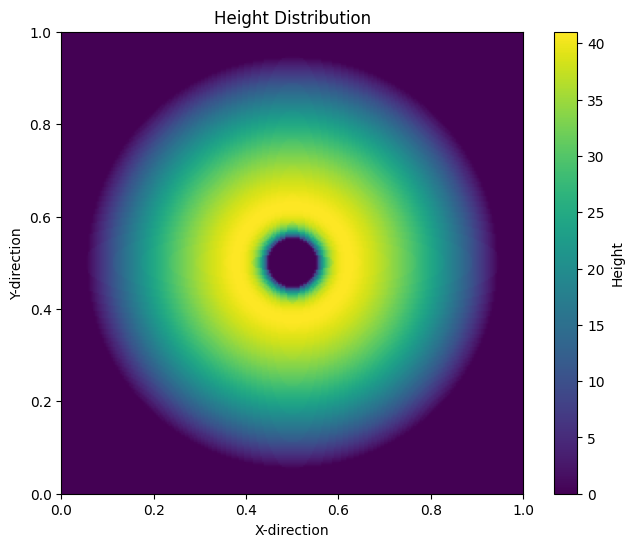

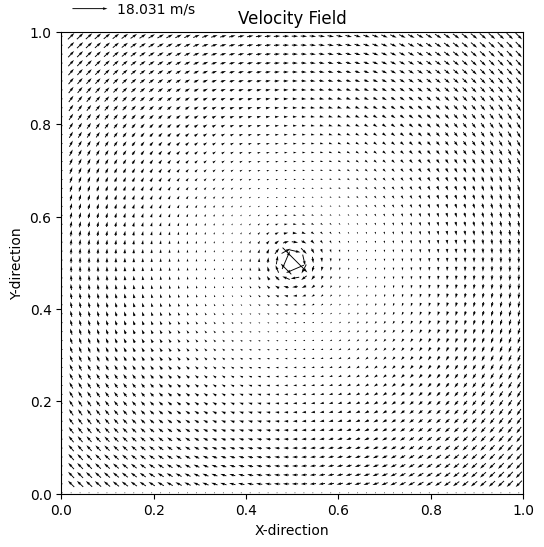

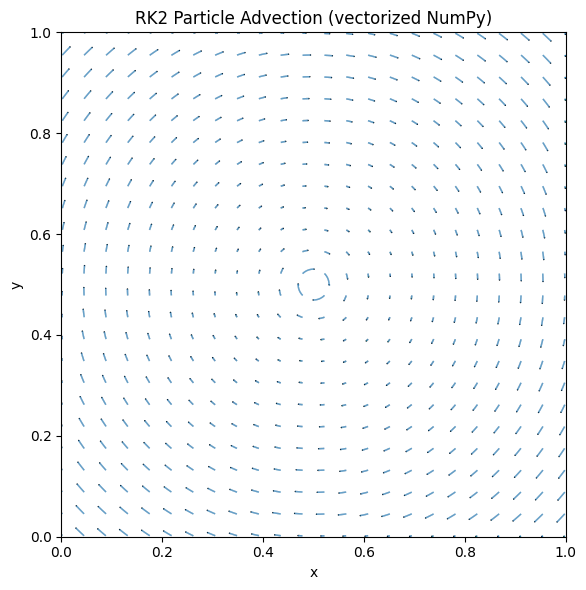

In [7]:
numCellsX = numCellsY = 256

gprime = 0.05      # << pick ≪ 1.0; tune 0.01–0.2 for “internal mode” feel
r_drag = 1e-4      # << tiny Rayleigh/bottom drag (optional but helpful)


coriolisForce = 10.0  # s^-1
coriolis = np.full((numCellsY+2, numCellsX+2), coriolisForce, dtype=np.float64)

# f0   = 2.0         # baseline Coriolis
# beta = 0.0         # set >0 to get jets/Rossby waves; e.g., 4.0
# # Build coriolis with ghost ring:
# y = np.linspace(0, gridYLength, numCellsY+2)
# coriolis = np.empty((numCellsY+2, numCellsX+2))
# for j in range(numCellsY+2):
#     coriolis[j, :] = f0 + beta*(y[j] - 0.5*gridYLength)

gridXLength = gridYLength = 1.0
cellXLength = gridXLength / numCellsX
cellYLength = gridYLength / numCellsY
gravity = 1.0
layerDepth = 1.0
fastestSignalSpeed = math.sqrt(gravity * layerDepth)
# height, xVelocity, yVelocity = initializeWithRipple(
#     numCellsX, numCellsY,
#     gridXLength, gridYLength,
#     layerDepth,
#     bumpAltitude,
#     bumpWidth,
#     bumpCenterX, bumpCenterY
# )
height, xVelocity, yVelocity = initializeWithVortex(
    numCellsX, numCellsY,
    gridXLength, gridYLength,
    layerDepth,
    0.5, 0.5,
    mode="rankine",
    Omega=-4.0,          # used when mode="solid"  (rad/s in non-dim units)
    Vmax=1.0, Rc=-0.15,  # used when mode="rankine"
    f=coriolis, g=gprime,
    balanced=True
)

# height = np.full((numCellsY+2, numCellsX+2), layerDepth, dtype=np.float64)
# xVelocity = np.zeros((numCellsY+2, numCellsX+2), dtype=np.float64)
# yVelocity = np.zeros((numCellsY+2, numCellsX+2), dtype=np.float64)
# b = make_bathymetry(numCellsX+2, numCellsY+2)
b = np.zeros((numCellsY+2, numCellsX+2), dtype=np.float64)
plot_bathymetry(b, numCellsX+2, numCellsY+2)

# store interior sizes for step_numba
nx = numCellsX
ny = numCellsY

# boundary condition mode (choose what you want)
bc_mode = bc_mode_from_string("periodic")
# bc_mode = bc_mode_from_string("reflective")
# bc_mode = bc_mode_from_string("open")

CFL = 0.4

# estimate timestep the same way, but we should base it on interior values of ghost arrays
maxSpeed = np.maximum(
    np.abs(xVelocity[1:ny+1,1:nx+1]) + fastestSignalSpeed,
    np.abs(yVelocity[1:ny+1,1:nx+1]) + fastestSignalSpeed
).max()

dt  = CFL * min(cellXLength, cellYLength) / maxSpeed
dt0 = CFL * min(cellXLength, cellYLength) / fastestSignalSpeed

nSteps = 2000
outputEvery = 25

# mass: use only interior of ghosted height
startingMass = height[1:ny+1,1:nx+1].sum()

averageNeighborMultiple = 0.001

# momentum helper arrays for diagnostics if you still want them
hu = height[1:ny+1,1:nx+1] * xVelocity[1:ny+1,1:nx+1]
hv = height[1:ny+1,1:nx+1] * yVelocity[1:ny+1,1:nx+1]

t = 0.0
H0 = layerDepth        # e.g. 1.0
waveAmp = 0.02         # keep small
waveFreq = 10.0        # rad/s (tune)
driveCols = 5          # 3-5 is usually stable


fig, ax, img, cbar = init_plot(height, gridXLength, gridYLength)
plotHeight()
plotVelocityField(xVelocity, yVelocity, gridXLength, gridYLength)
plot_particle_advection_vectorized(xVelocity, yVelocity)

Step: 0


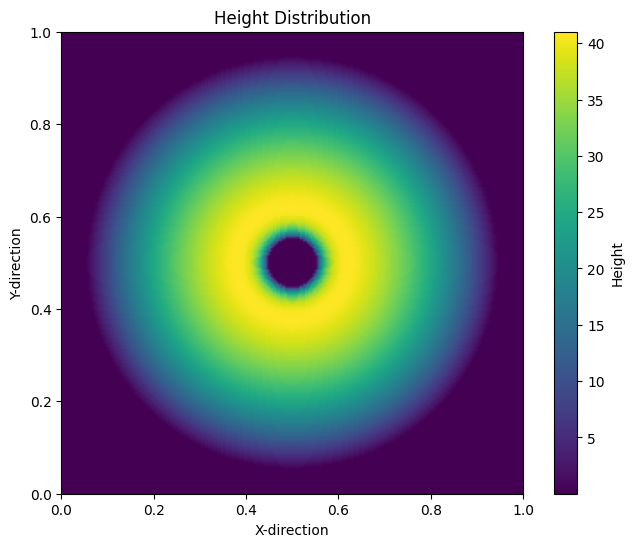

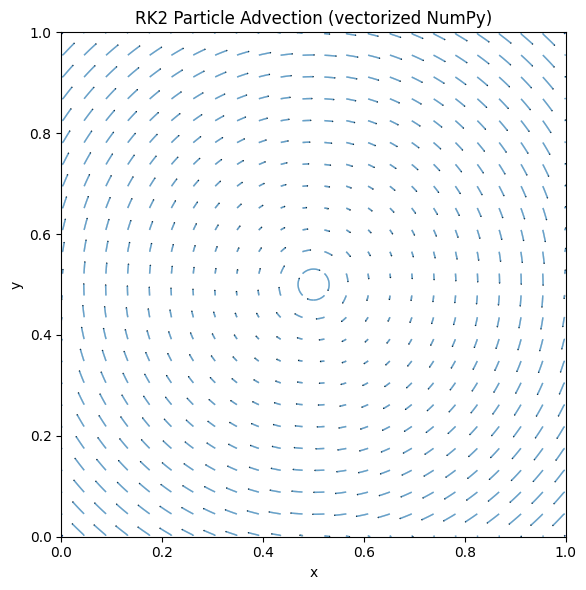

Step: 25


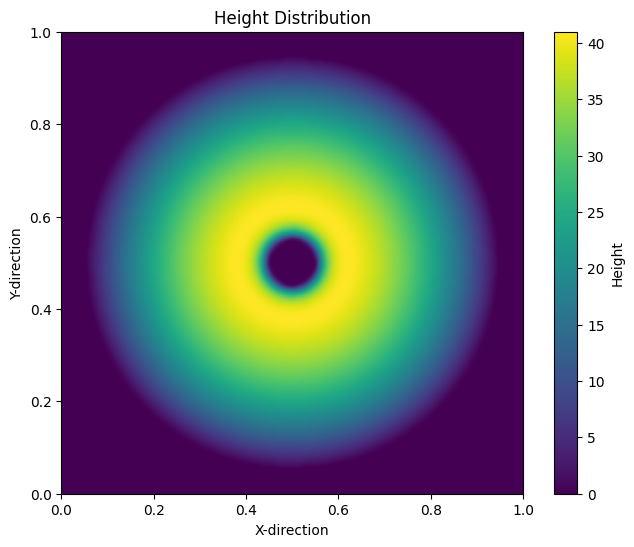

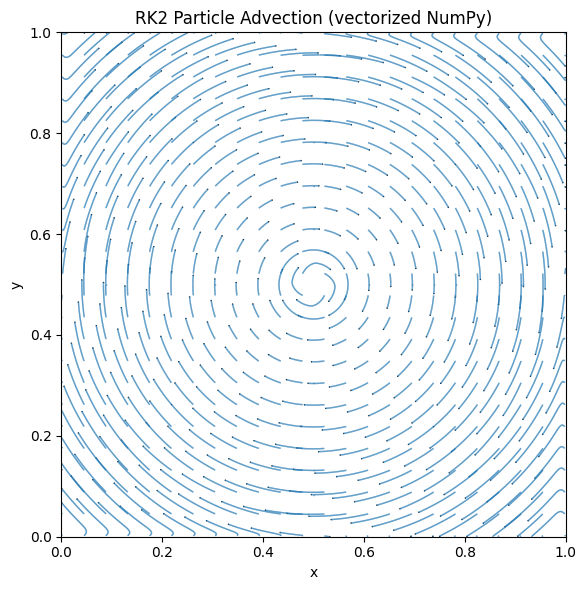

Step: 50


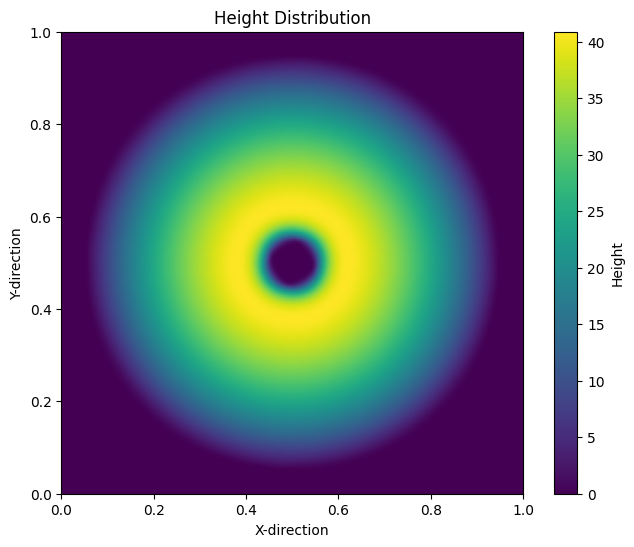

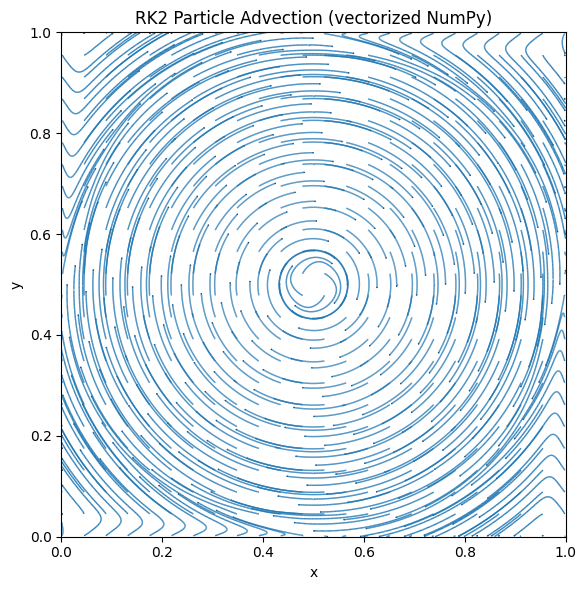

Step: 75


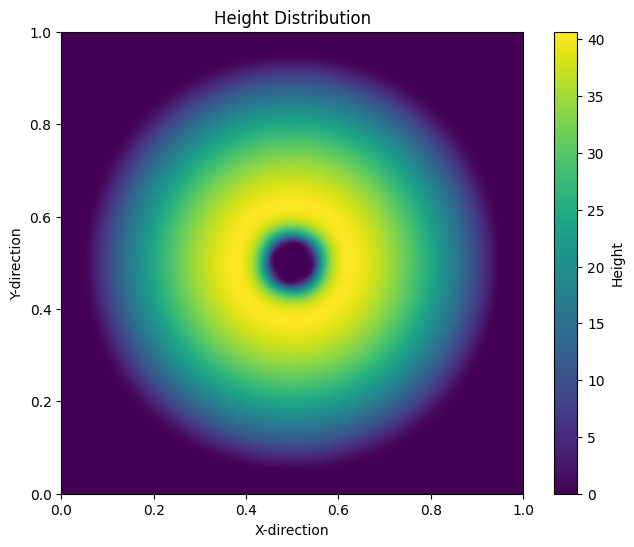

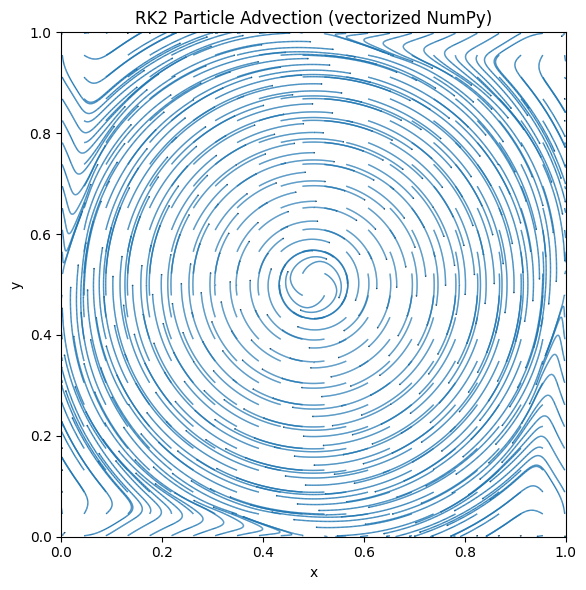

Step: 100


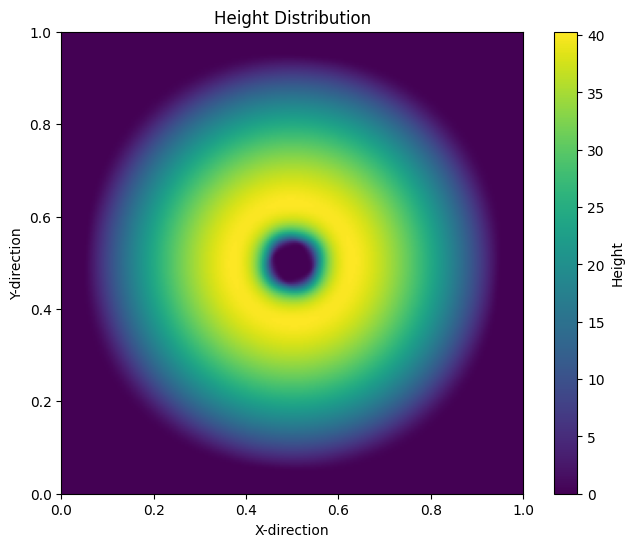

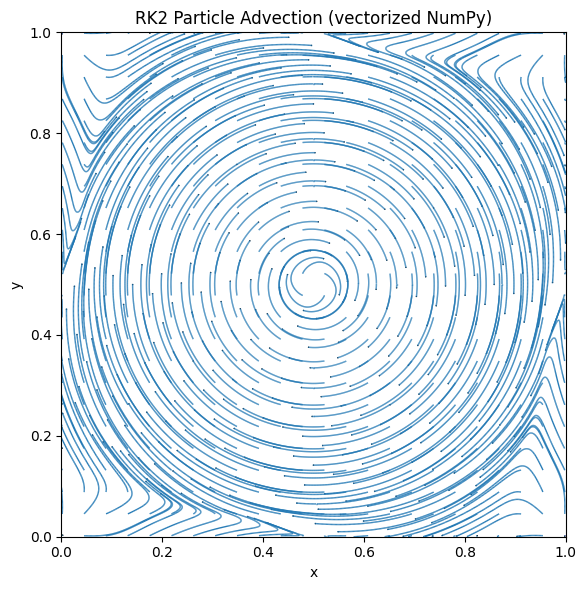

Step: 125


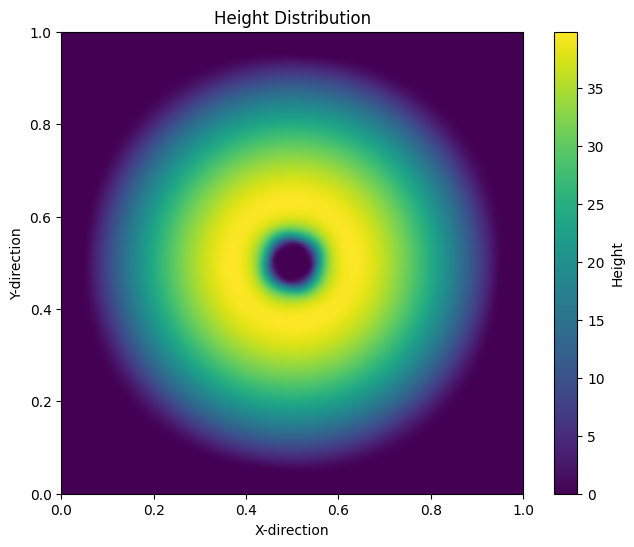

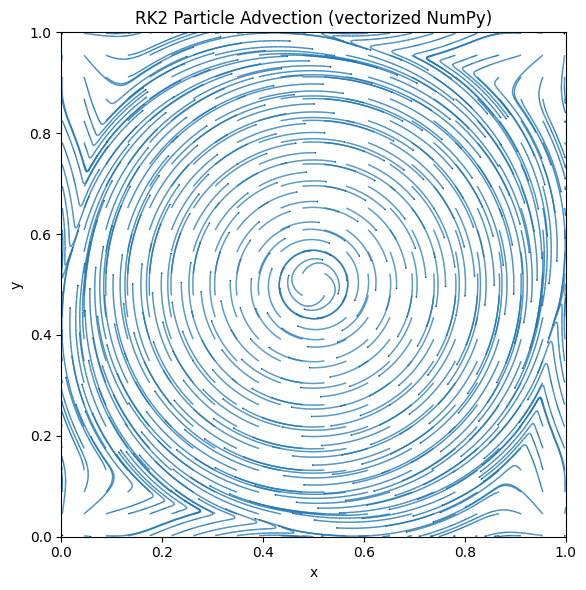

Step: 150


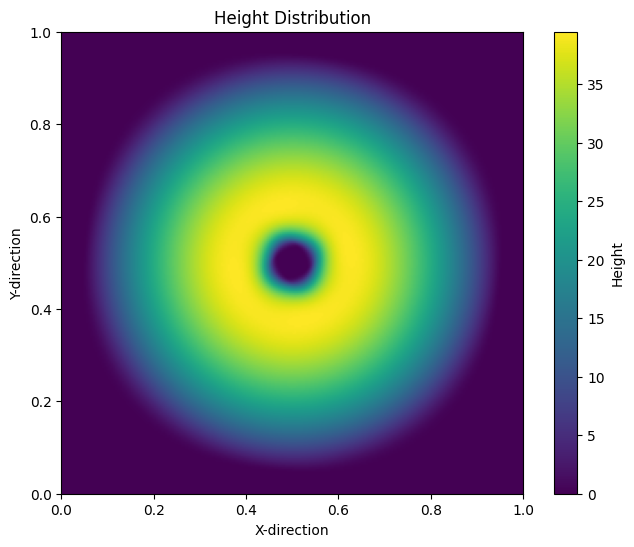

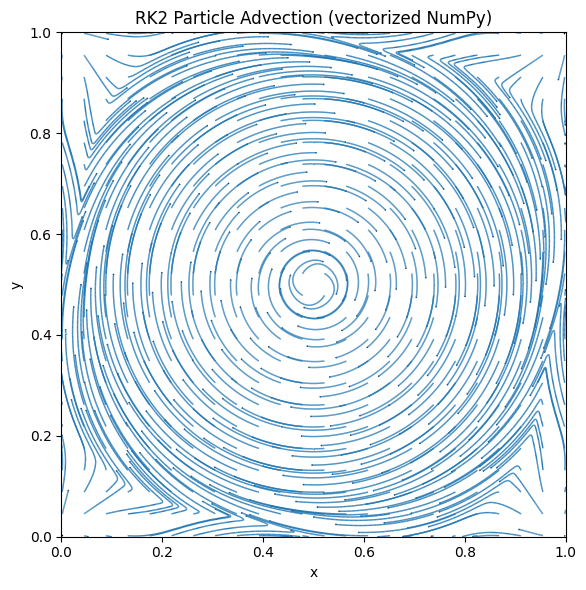

Step: 175


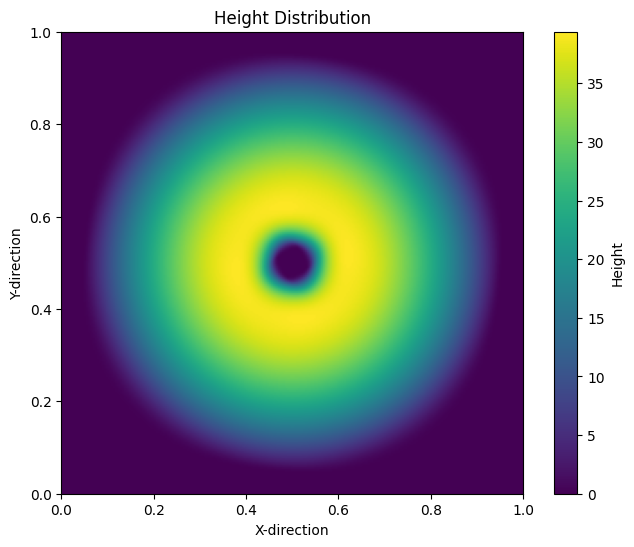

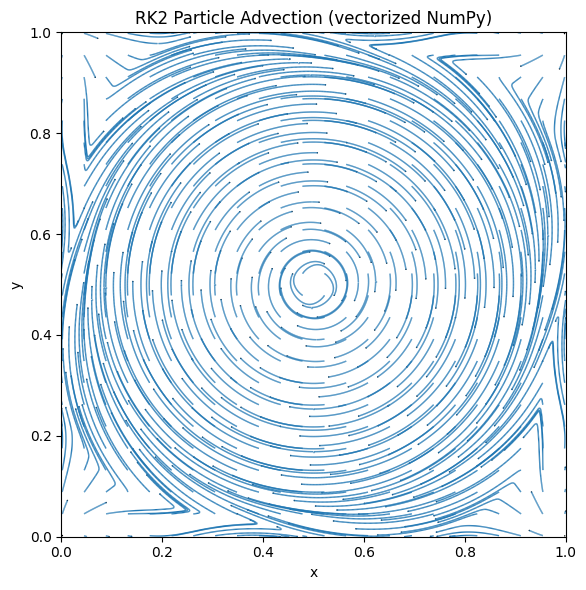

Step: 200


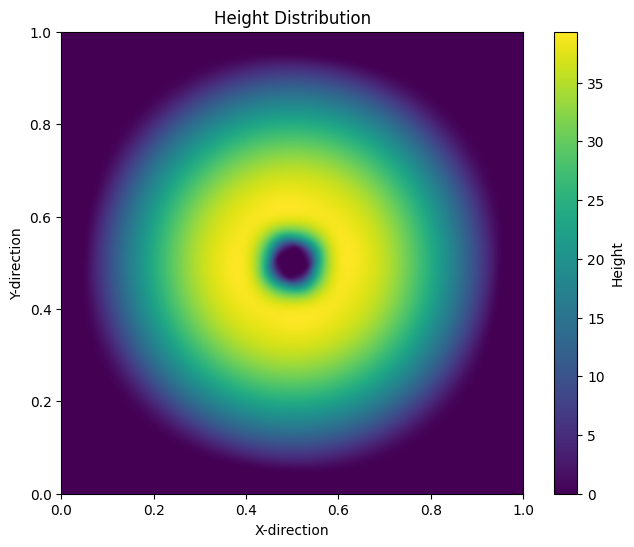

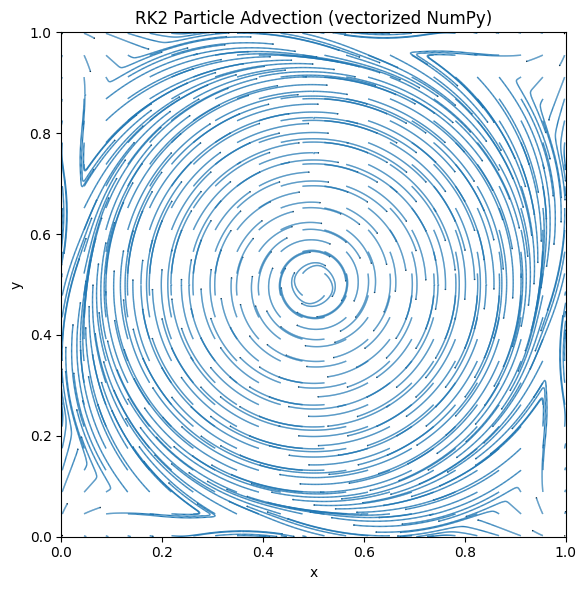

Step: 225


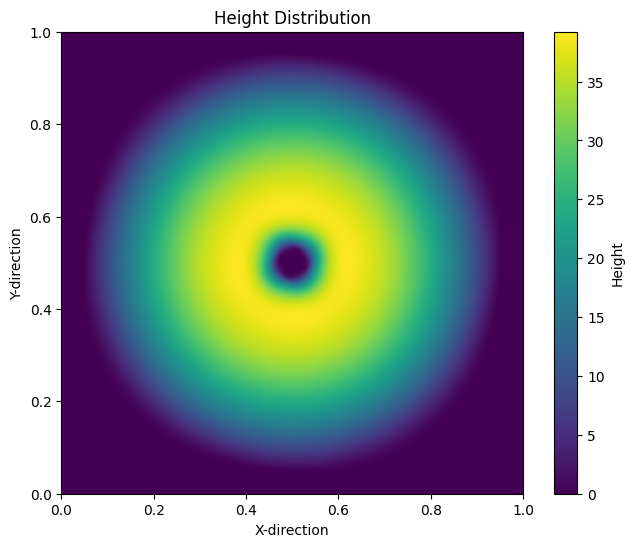

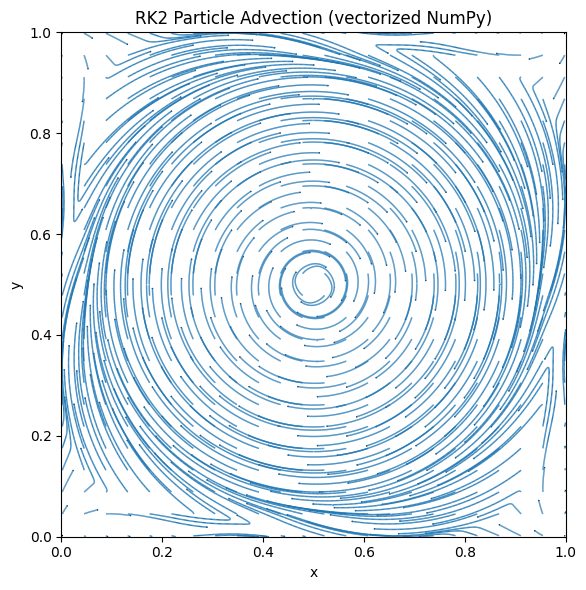

Step: 250


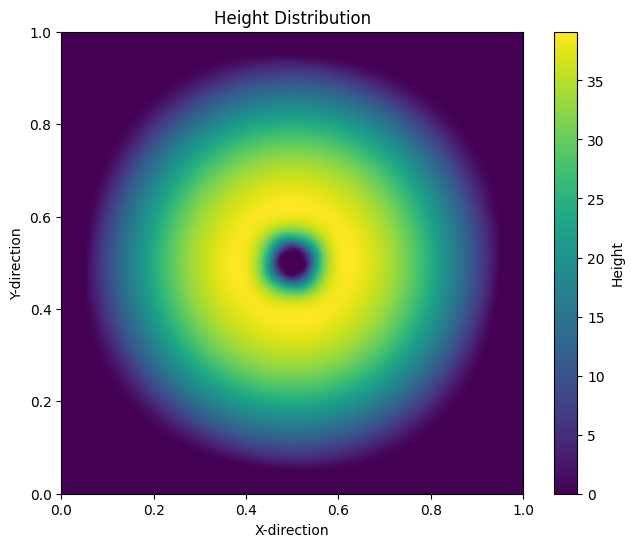

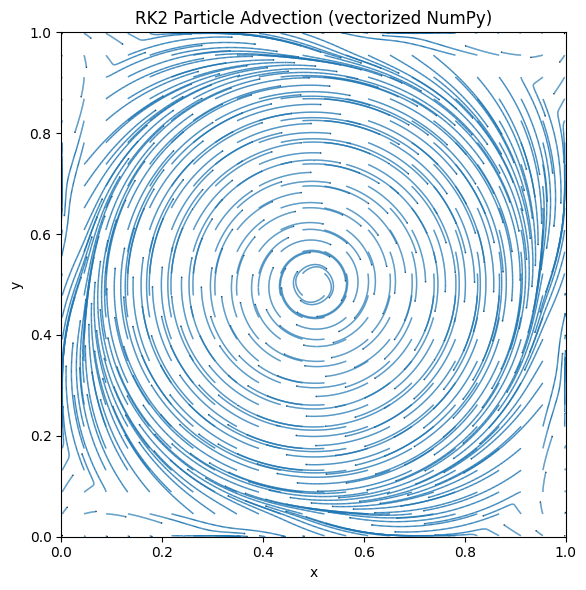

Step: 275


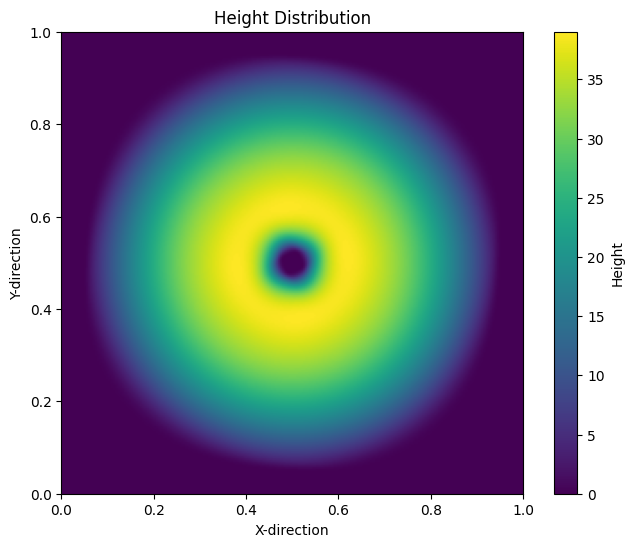

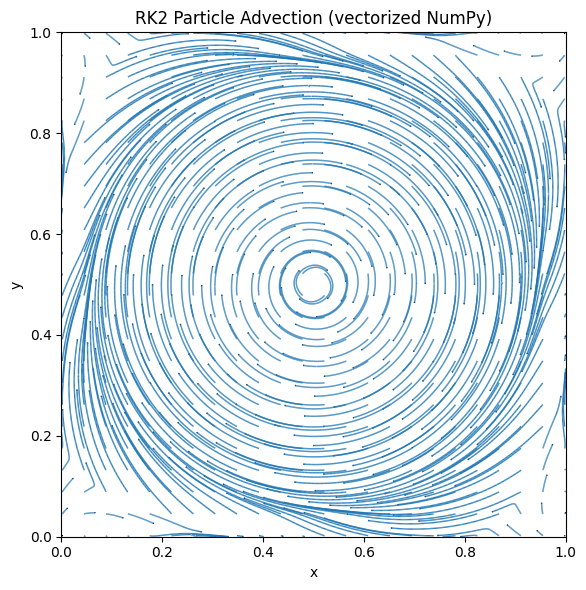

Step: 300


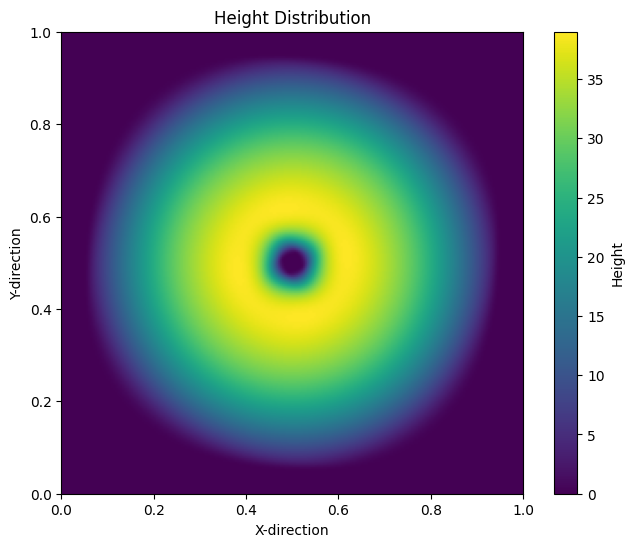

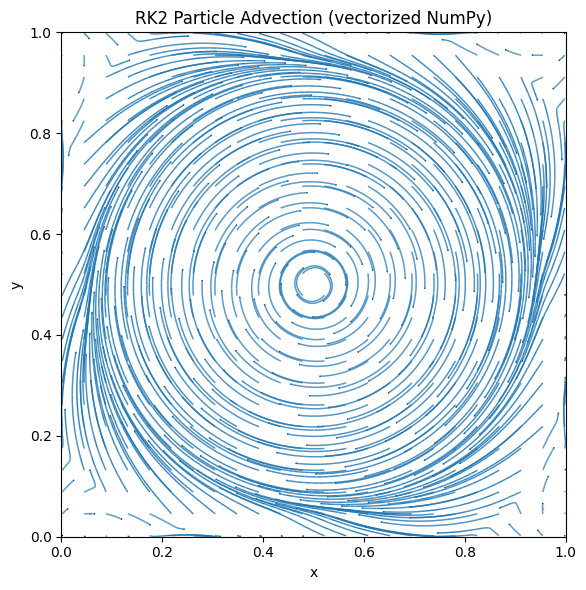

Step: 325


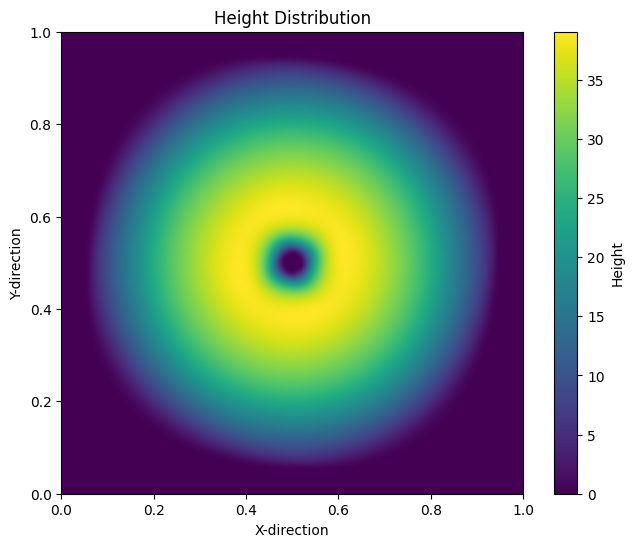

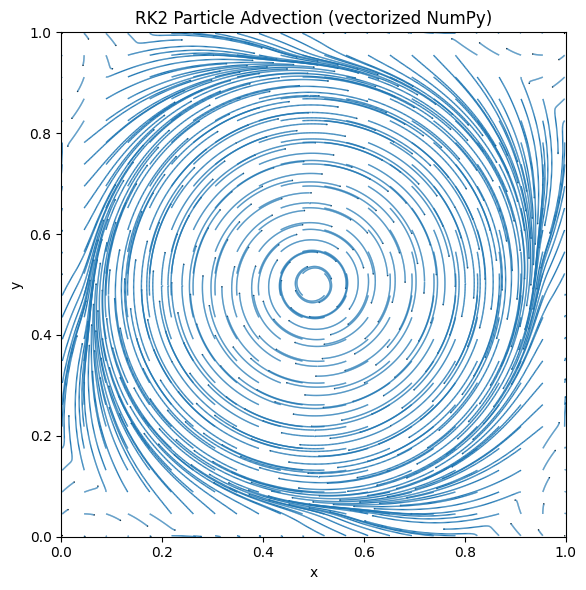

Step: 350


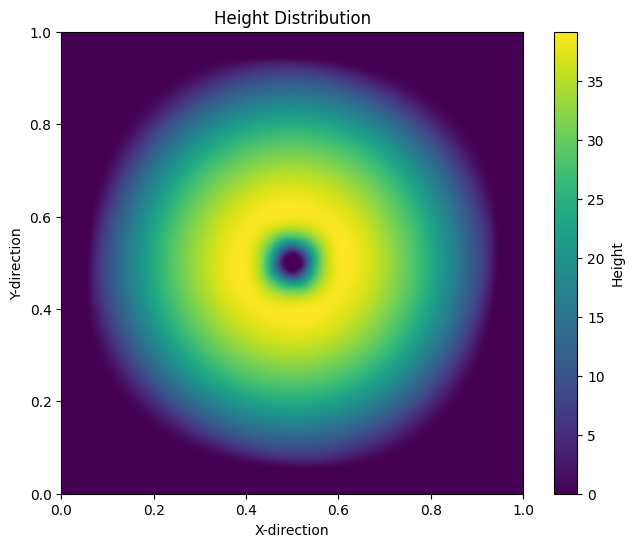

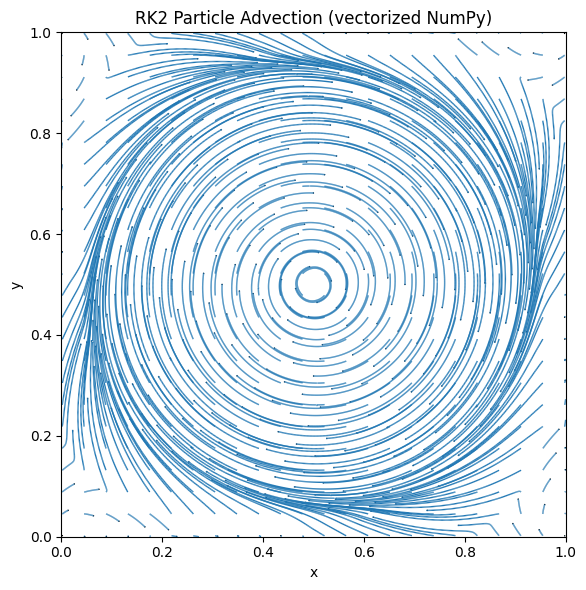

Step: 375


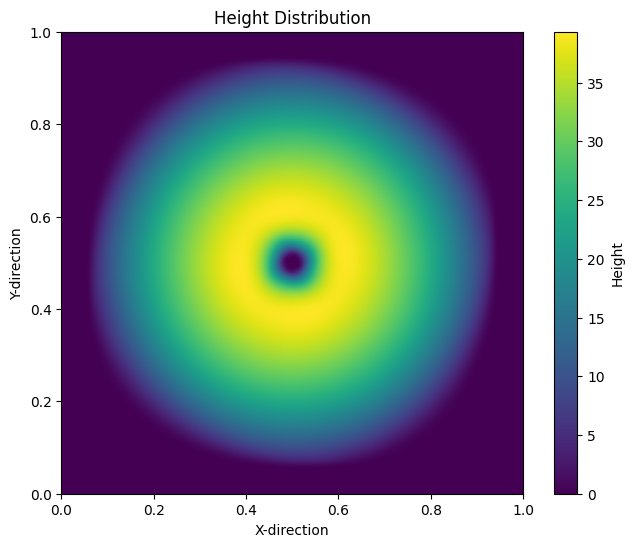

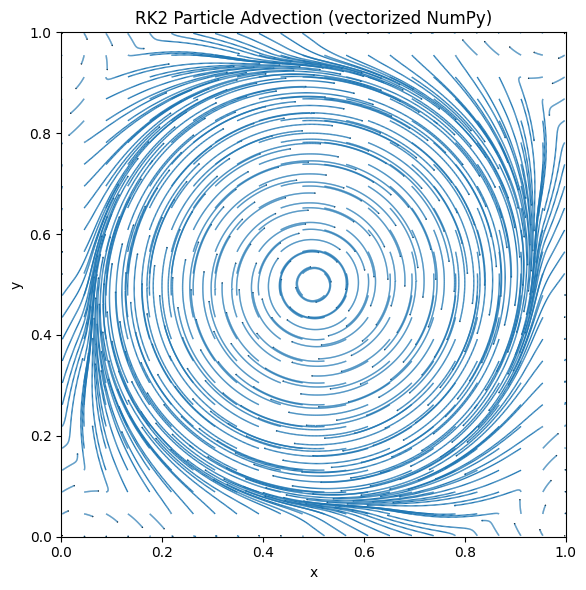

Step: 400


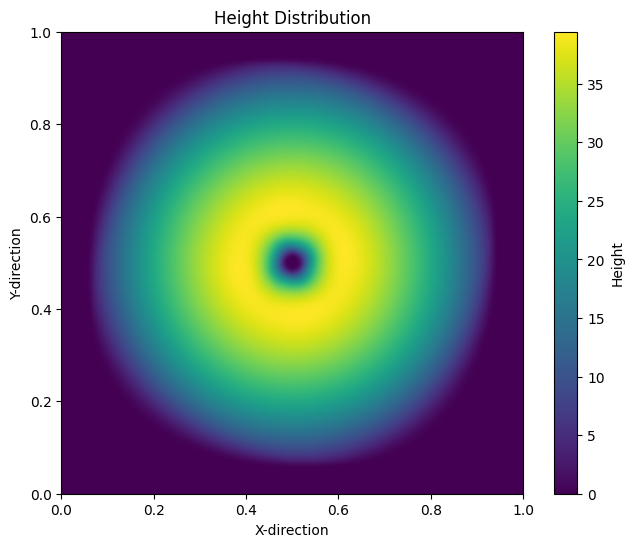

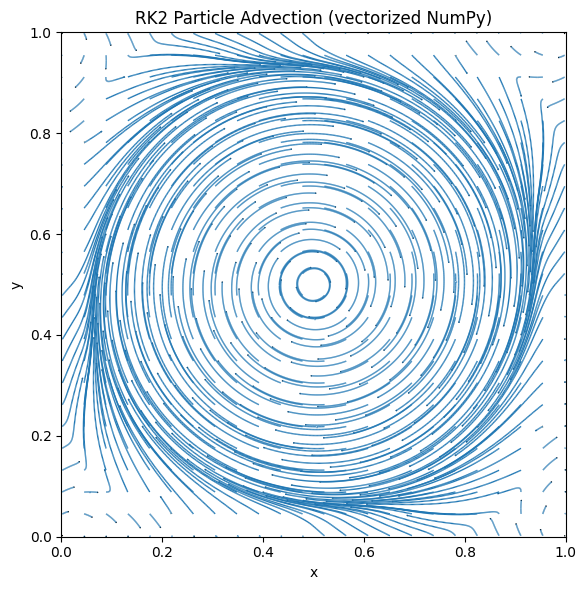

Step: 425


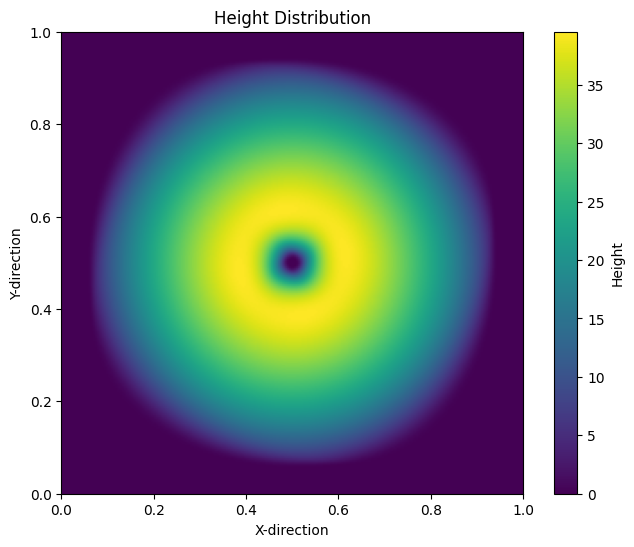

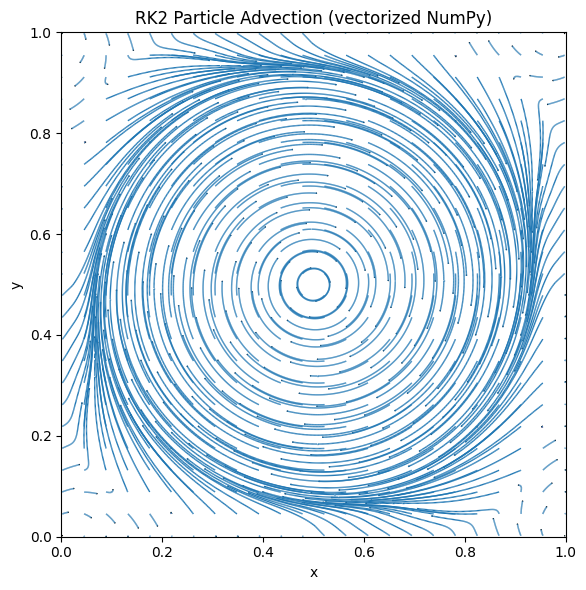

Step: 450


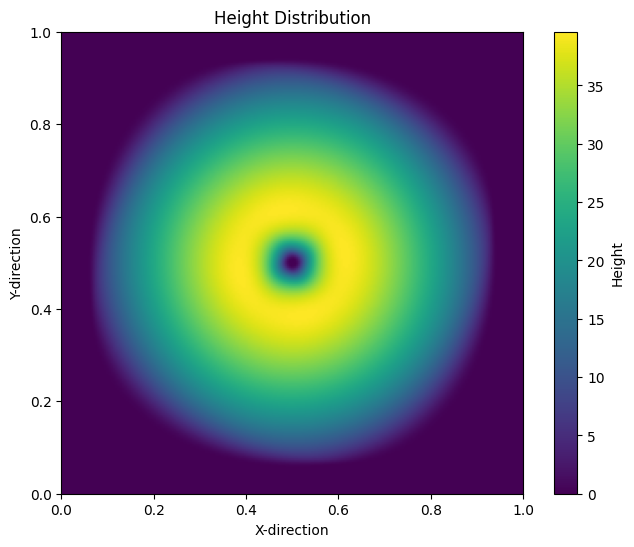

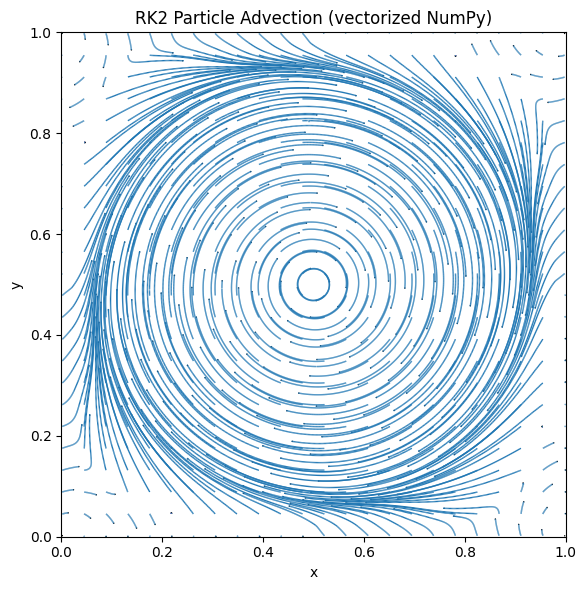

Step: 475


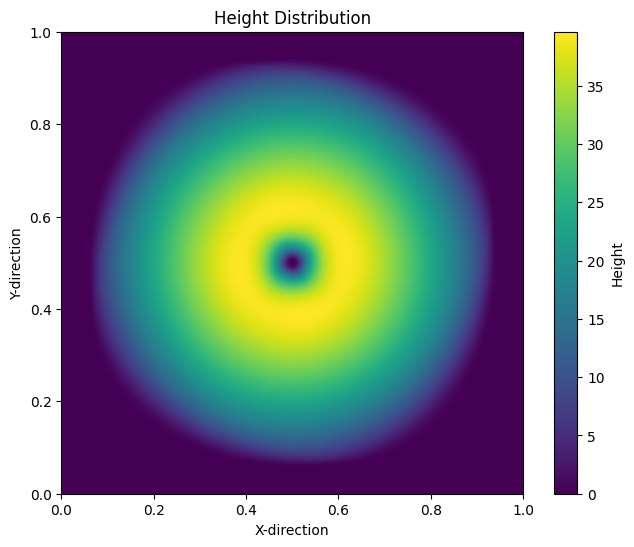

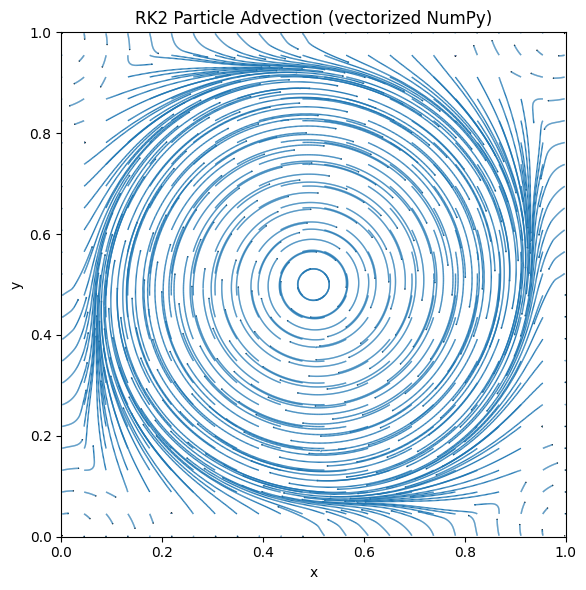

Step: 500


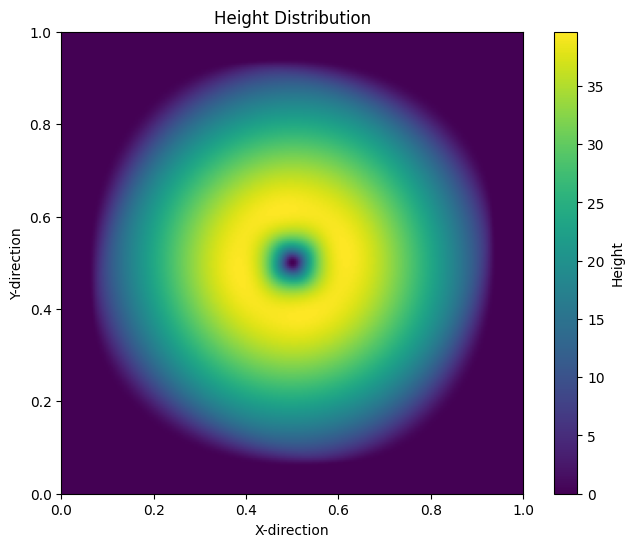

KeyboardInterrupt: 

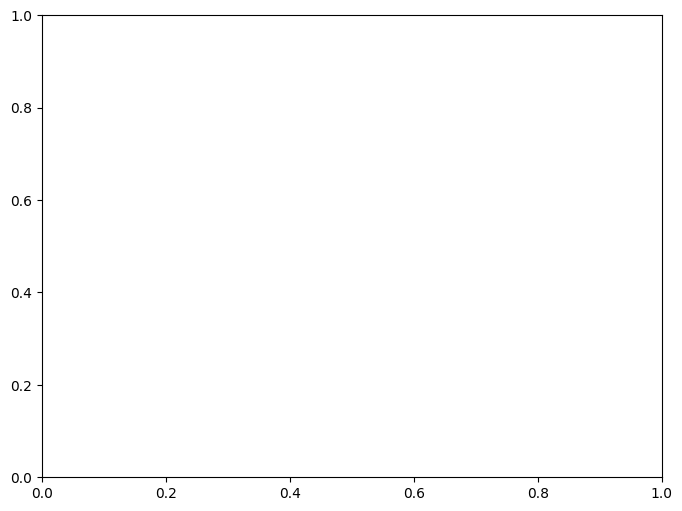

In [8]:
for i in range(nSteps):
    dt = compute_dt(height, xVelocity, yVelocity,
                gprime, CFL, cellXLength, cellYLength,
                coriolis=coriolis, nu=0.0)


    # 2. drive the left boundary (wave maker)
    # drive_left_boundary_height(height,
    #                            xVelocity,
    #                            yVelocity,
    #                            H0,
    #                            waveAmp,
    #                            waveFreq,
    #                            t,
    #                            driveCols)

    height, xVelocity, yVelocity = step_numba(
        height,
        xVelocity,
        yVelocity,
        dt,
        cellXLength,
        cellYLength,
        b,
        coriolis,
        g=gprime,
        nu=0.0,
        h_eps=1e-12,
        nx=nx,
        ny=ny,
        bc_mode=bc_mode,
        r_drag=r_drag
    )

    # saveHeightFrameFast(fig, ax, img, cbar, height, i)

    t += dt

    if i % 25 == 0:
        print(f"Step: {i}")
        plotHeight()
        # plotVelocityField(xVelocity, yVelocity, gridXLength, gridYLength)
        plot_particle_advection_vectorized(xVelocity, yVelocity)
        # print(np.max(np.abs(xVelocity)), np.max(np.abs(yVelocity)))




In [ ]:
filename = 'wavesWithTopography'
!ffmpeg -framerate 60 -i /content/frames/frame_%05d.png -pix_fmt yuv420p {filename}.mp4

from google.colab import files
files.download(f"{filename}.mp4")
